### Import knihoven a konfigurace

In [ ]:
!pip install --upgrade ultralytics
import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

from improutils import *
from google.cloud import vision

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})


[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
/shared-libs/python3.8/py/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Úkol

Výchozím bodem k tomuto úkolu je [cvičení na perspektivní transformaci](https://courses.fit.cvut.cz/BI-SVZ/tutorials/files/6/perspective-measuring-length.html).

### První část - rovnání dokumentu a následná aplikace OCR
Práce probíhá se souborem `ocr_img.jpg` na kterém se nachází dokument známých rozměrů (papír A4). Dokument je potřeba transformovat na kolmý pohled a následně využít Google Cloud Vision API k automatizovanému přečtení textu pomocí OCR. Za tuto část je možné získat maximálně **3 body** a **až 1 prémiový**.

![](ocr_img.jpg)

**1) Načtěte obrázek, zobrazte ho a uložte si pole cílových korespondečních souřadnic rohů dokumentu.**

Souřadnice rohů papíru v rovině do které chceme obrázek převést jsou desetinásobné rozměry papíru A4, aby rozměry nebyly menší než projektovaný obrázek a neztratila se žádná informace.

In [ ]:
image = load_image('ocr_img.jpg') # načtení obrázku

# souřadnice rohů papíru v rovině do které promítáme
real_world_pts = np.array([(0,0),(2100,0),(2100,2970),(0,2970)]) 

**2) Pomocí oblíbeného grafického editoru vyberte obrazové souřadnice rohů dokumentu ve snímku.**  
Souřadnice musí korespondovat pořadím, takže pokud je levý roh první v předchozím poli, musí být první vybrán i v tomto kroku.

format: x, y 
 [[ 726 1118]
 [ 150  559]
 [ 976  117]
 [1557  453]]


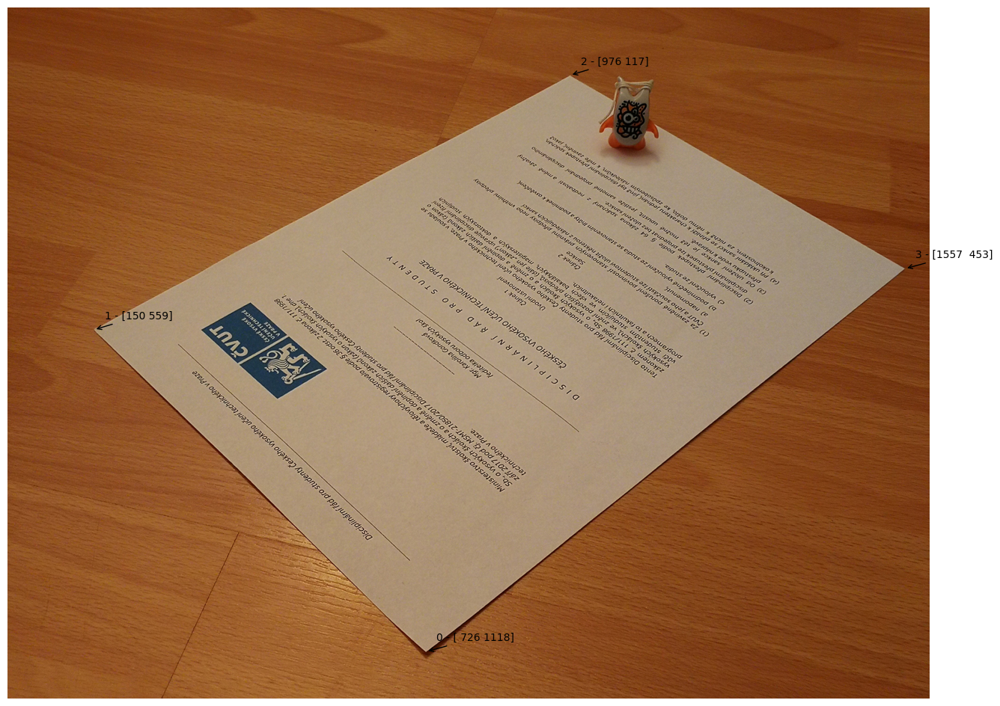

In [ ]:
# rohy papíru v původním obrázku
image_pts = np.array([(726, 1118),(150,559),(976,117),(1557,453)])

if (len(image_pts) != len(real_world_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts)

plot_images(image)
for i, pt in enumerate(image_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

**3) Vypočtěte transformační matici H, vypište její tvar.**

In [ ]:
# projektivní matice H
H, mask = cv2.findHomography(image_pts, real_world_pts)
print(H)

[[-2.204 -2.754 4679.329]
 [2.435 -2.509 1037.157]
 [-0.000 0.001 1.000]]


**4) Popište rozdíl mezi [`cv2.getPerspectiveTransform()`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#ga8c1ae0e3589a9d77fffc962c49b22043) a [`cv2.findHomography`](https://docs.opencv.org/3.4.1/d9/d0c/group__calib3d.html#ga4abc2ece9fab9398f2e560d53c8c9780).**

Obě funkce počítají projektivní matici. Rozdíl je, že funkce findHomography počítá obecnější projekci zdrojové roviny do cílové roviny, zatímco getPerspectiveTransform počítá projektivní matici čistě pro čtveřici bodů.

**5) Využijte funkci [`cv2.warpPerspective`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87) k vytvoření kolmého pohledu dokumentu, výsledek zobrazte a uložte.**

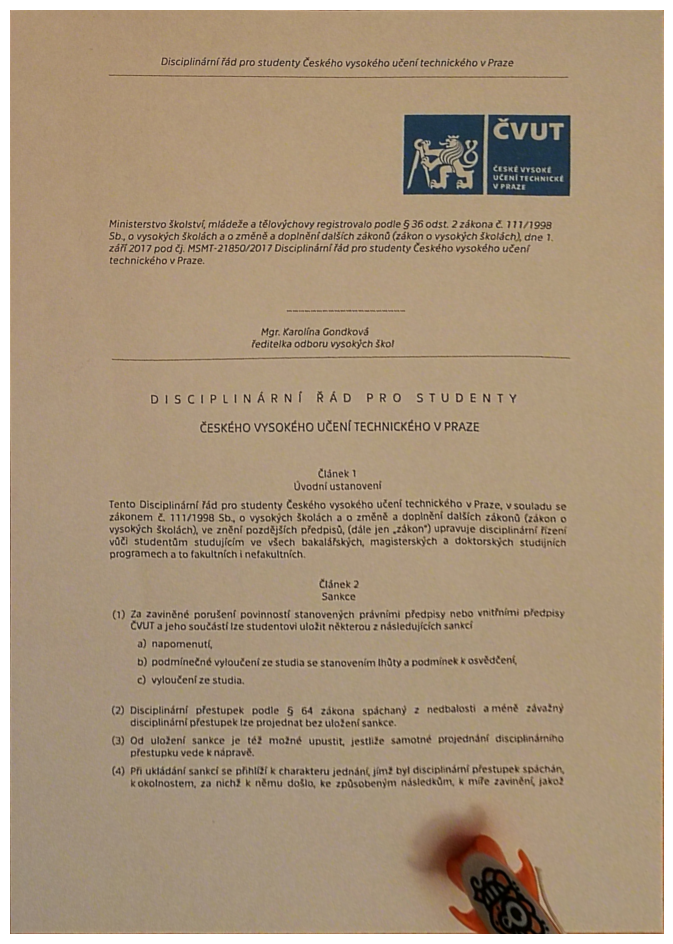

In [ ]:
# aplikace perspektivní transformace na obrázek
warped_img = cv2.warpPerspective(image, H, (2100, 2970))
plot_images(warped_img)

**7) Detekujte text na "narovnaném" obraze pomocí níže uvedené funkce, text vypiště a uložte do textového souboru.** 

In [ ]:
def ocr_google(img_path):
    """Detects text in the file."""
    
    api_key = 'api-key.json'
    assert os.path.exists(api_key), 'There is no API-KEY in your path! You need to contact google to get one.'
    client = vision.ImageAnnotatorClient.from_service_account_json(api_key)
    
    with io.open(img_path, 'rb') as image_file:
        content = image_file.read()

    image = vision.Image(content=content)
    response = client.text_detection(image=image)
    annotations = response.text_annotations

    return annotations

In [ ]:
# to_be_read = crop(warped_img, )
# img_bin = segmentation_two_thresholds(img, 0, 50)
# filtered = filtration_median(img, 5)
# segmented = segmentation_adaptive_threshold(filtered, 10)
# img_bin, _, _ = find_holes(segmented, 100)
# ocr(img_bin)

#### Bonus k první části
Jak je vidět, výsledky po aplikaci OCR nejsou zcela uspokojivé. Je však v nutné brát potaz, že vstupní obraz není kromě geometrické transformace nijak dále předzpracován. Vzpomeňte si na cvičení, kde jsme aplikovali OCR s knihovnou Tesseract. Tam byly poměrně přísné nároky na vstupní obraz, který musel být perfektně předzpracovaný a v binární podobě. Tesseract je citlivý i na drobné natočení nebo deformování textu. Řešení od Google je v tomto ohledu značně robustnější.

**8) Pokuste se vstupní obraz před aplikací OCR kvalitněji předzpracovat pomocí probíraných technik - crop, segmentace, zaostření, rozmazání, jas, kontrast, apod. Fantazii se meze nekladou. Stručně diskutujte poznatky a vlivy jednotlivých operací na výslednou kvalitu. <span style="color:blue">(0.5 bodu)</span>**

**9) Využijte Google Cloud Translate API k přeložení výsledného textu do angličtiny, výsledek zobrazte a uložte do textového souboru. <span style="color:blue">(0.5 bodu)</span>**

### Druhá část - výtvarné umění na FITu
Práce probíhá s fotografií `fit_budova.jpg` od autora Tomáše Kouby a s malbou `fit_logo.jpg` od autora Lukáš Brchla. Cílem je umístit obrázek loga na stěnu budovy FITu viz obrázek. Za tuto část je možné získat maximálně **3 body** a **až 1 prémiový**.

![](fit_logo_merged.jpg)

**1) Načtěte obrázky a vytvořte pole korespondečních souřadnic rohů malby.**

In [ ]:
# načtení obrázků
main_img = load_image('fit_budova.jpg')
logo_img = load_image('fit_logo.jpg')

# pozice rohů loga
logo_pts = np.array([(0,0),(141,0),(141,719),(0,719)])

**2) Vyberte souřadnice v obraze, do kterých má být logo transformováno (pozor na pořadí).**

format: x, y 
 [[189  25]
 [251  66]
 [172 412]
 [ 69 415]]


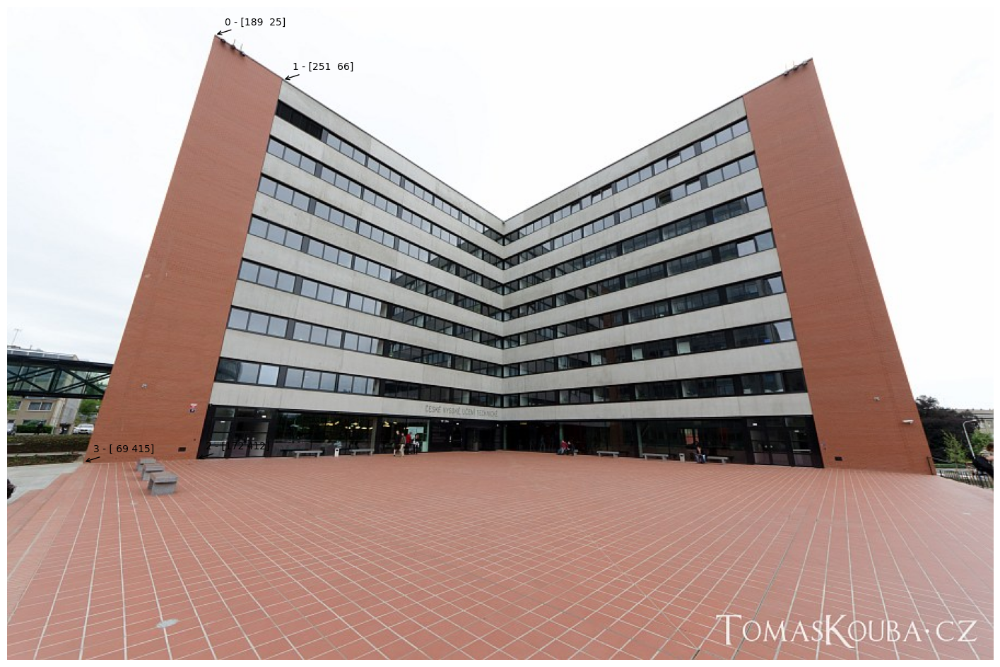

In [ ]:
# pozice rohů stěny v obrázku
image_pts = np.array([(189,25),(251,66),(172,412),(69,415)])
if (len(image_pts) != len(logo_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts)

plot_images(main_img)
for i, pt in enumerate(image_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

**3) Vypočtěte transformační matici H, vypište její tvar.**

In [ ]:
# projektivní matice H
H, mask = cv2.findHomography(logo_pts, image_pts) ###
print(H)

[[0.661 -0.196 189.000]
 [0.349 0.368 25.000]
 [0.001 -0.000 1.000]]


**4) Využijte funkci `cv2.warpPerspective()` k vytvoření stejné perspektivy loga jako fotografie budovy. Zobrazte výsledky.**

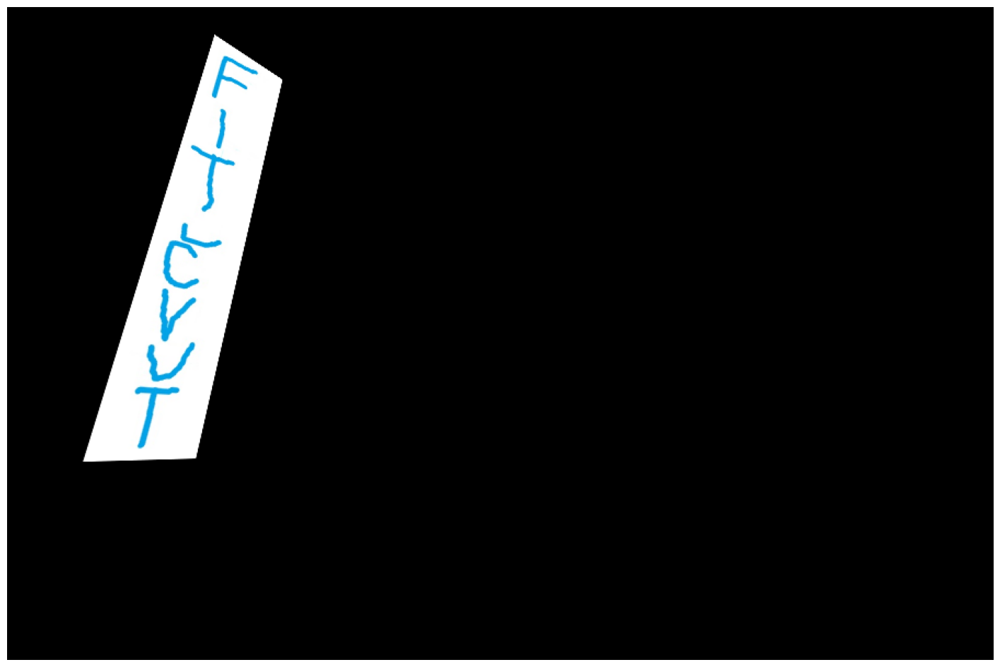

In [ ]:
# aplikace perspektivní transformace na obrázek
warped_logo = cv2.warpPerspective(logo_img, H, (900, 596)) #
plot_images(warped_logo)

**5) Logo je nutné umístit na budovu bez bílého pozadí, je tedy nutné ho segmentovat.**

Tady se mohou vaše postupy lišit. Kvalita segmentace následně razantně rozhoduje o kvalitě výsledku. Zkuste experimentovat s různými druhy segmentace a zkuste využít i nějaké funkce pro předzpracování, jako např. rozmazání. Může se vám hodit funkce `cv2.bitwise_and`.

In [ ]:
# funkce ze cvičení, najde vnitřní kontury v binárním obrázku
def find_holes(img_bin,min_area = 0, max_area=1000000,fill = True):
    contours, hierarchy = cv2.findContours(img_bin,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    hole_indices = [ i for i in range(len(hierarchy[0])) if hierarchy[0,i,-1] != -1]    
    contours = [contours[hole_index] for hole_index in hole_indices if min_area < cv2.contourArea(contours[hole_index]) <= max_area]
    thick = cv2.FILLED
    if not fill: thick = 2
    contours_drawn = cv2.drawContours(np.zeros(img_bin.shape, dtype=np.uint8), contours, -1, color=(255, 255, 255),thickness=thick)
    return contours_drawn, len(contours), contours

In [ ]:
def seg1(img): # adaptive segmentation
    img_bin = to_gray(img)
    img_bin = filtration_median(img_bin, 5)
    return segmentation_adaptive_threshold(img_bin, 60)

def seg2(img): # BGR segmentation
    seg = segmentation_two_thresholds(img, (220, 150, 0),(255, 200, 120))
    return negative(seg)

def seg3(img): # BGR segmentation
    seg = segmentation_two_thresholds(img, (210, 145, 0),(240, 180, 25))
    return negative(seg)

def seg4(img): # BGR segmentation
    seg = segmentation_two_thresholds(img, (220, 155, 0),(240, 170, 25))
    return negative(seg)


In [ ]:
# funkce z obrázku vysegmentuje text a vytvoří binární masku v místě textu
def segmentation_algorithm(img):
    img = cv2.blur(img, (3,3))
    segmented2 = seg3(img)
    mask2, _, _ = find_holes(segmented2, 0)
    cut2 = cv2.bitwise_and(warped_logo,warped_logo,mask = mask2)

    segmented3 = seg4(img)
    mask3, _, _ = find_holes(segmented3, 0)
    cut3 = cv2.bitwise_and(warped_logo,warped_logo,mask = mask3)

    return cut2, mask2, cut3, mask3

Použití rozmazání obrázku přes 3 x 3 jádro zlepšilo výsledky segmentace. Experimentovalo se s adaptivní segmentací, která nedopadla tolik dobře, jako přímá segmentace barev z BGR obrázku, následně se vyladily mezní hodnoty a níže jsou zobrazeny 2 nejlepší výstupy.

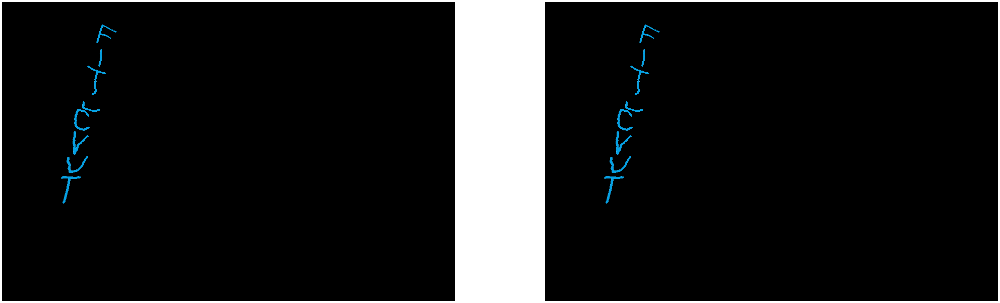

In [ ]:
logo_seg1, mask1, logo_seg2, mask2 = segmentation_algorithm(warped_logo)
plot_images(logo_seg1, logo_seg2)

**6) Spojte zdrojovou fotografii budovy se segmentovaným logem. Výsledek zobrazte a uložte.**

Využijte operace numpy či opencv, pozor ať je zachována úroveň jasu. 

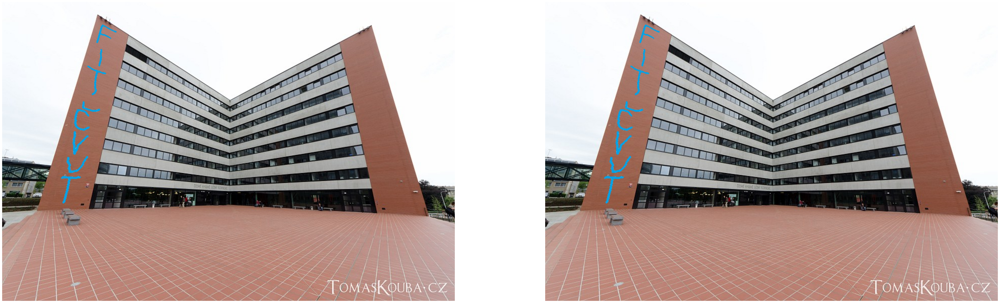

In [ ]:
# sloučení dvou obrázků, první je vysegmentované logo z předchozího výstupu
# a druhým je obrázek budovy přes invertovanou masku loga
merged_img1 = cv2.add(logo_seg1, cv2.bitwise_and(main_img,main_img,mask = cv2.bitwise_not(mask1)))
merged_img2 = cv2.add(logo_seg2, cv2.bitwise_and(main_img,main_img,mask = cv2.bitwise_not(mask2)))
plot_images(merged_img1,merged_img2)

Za nejlepší výsledek pokládám druhý výstup.

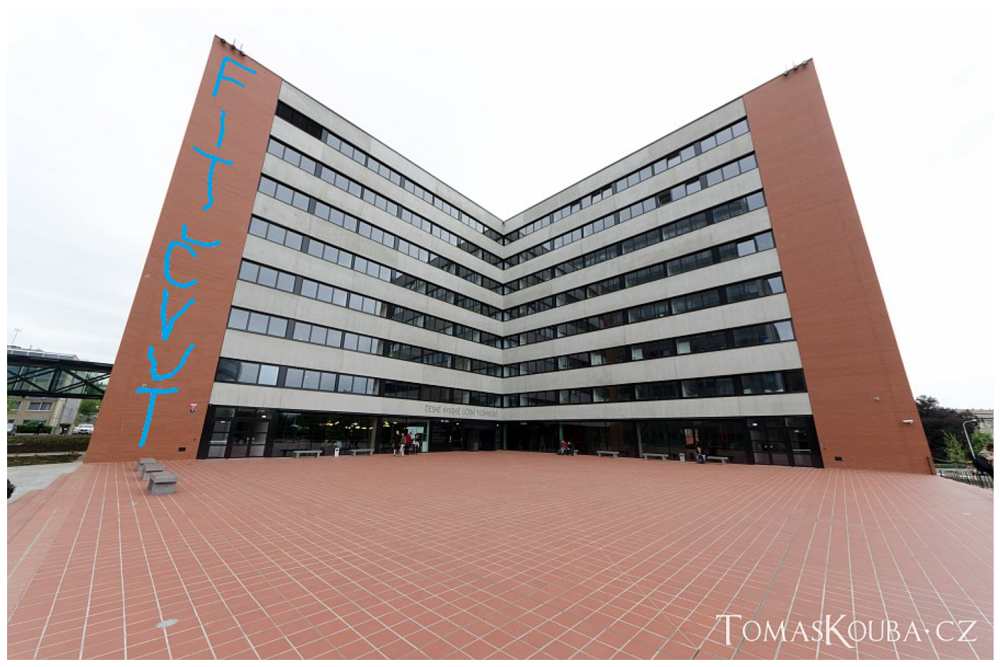

In [ ]:
plot_images(merged_img2)

#### Bonus k druhé části
**7) Vymyslete a naprogramujte další využití perspektivní transformace pro nadcházející studenty BI-SVZ. Pro získání nápadu se lze odpíchnout od témat spojování snímků (panorama), rozšířené reality a 3D rekonstrukce. Pokud vůbec netušíte, hledejte v Google images klíčová slova "homography" nebo "perspective transform". Znovu podotýkám, že fantazii se meze nekladou a nebojte se případné dotazy/nápady konzultovat přímo s námi! <span style="color:blue">(1 bod)</span>**


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=c0d6673a-e708-494d-8038-51a60e12e13d' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>